# Ứng dụng học sâu trong phát hiện hành vi của người điều khiển ô tô
## Nhóm 3 - 232IS54A01

## Mô tả bài toán

### Dữ liệu
Tập dữ liệu Kaggle - Driver Behavior Dataset (https://www.kaggle.com/datasets/robinreni/revitsone-5class)

***5 lớp của bộ dữ liệu:***
(1) Lái xe an toàn, (2) Nói chuyện điện thoại, (3) Nhắn tin trên điện thoại, (4) Quay ngang quay dọc và (5) Các hoạt động khác.

### Chiến lược phân tích

CNN (Convolutional Neural Network) là một phương pháp học sâu (deep learning), được thiết kế để nhận dạng các mẫu trong hình ảnh và video. CNN đặc biệt hữu ích cho các tác vụ phân loại hình ảnh vì chúng có thể tự động học cách phát hiện các đặc trưng như cạnh, góc và hình dạng trong hình ảnh. Ứng dụng với bài toán phát hiện hành vi người lái xe, CNN được sử dụng để phân tích cảnh quay video của người lái xe và xác định các mẫu hành vi có thể biểu thị các hoạt động lái xe không an toàn.

Mỗi kiến trúc CNN có những đặc điểm và ưu điểm riêng, vì vậy trong dự án này, AlexNet, VGGNet và Inception (GoogLeNet) được sử dụng để phân tích các hình ảnh. Kết quả phân tích được sử dụng để so sánh kiến trúc CNN nào phù hợp với bộ dữ liệu này.

### Import các thư viện

In [1]:
import os
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'

import tensorflow as tf
tf.get_logger().setLevel('ERROR')

import logging
logging.getLogger('tensorflow').setLevel(logging.ERROR)

import warnings
warnings.filterwarnings("ignore")

import glob
import random
import subprocess

import numpy as np
import pandas as pd
from numpy import asarray

import cv2
from PIL import Image

import graphviz
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
import seaborn as sns

from skimage.io import imread

from tensorflow import keras
from tensorflow.keras import layers, models, Input, Model
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.metrics import Accuracy
from tensorflow.keras.losses import CategoricalCrossentropy
from tensorflow.keras.utils import plot_model
from tensorflow.keras.callbacks import ReduceLROnPlateau

from sklearn.model_selection import train_test_split
from skimage import filters
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

from IPython.display import FileLink

## Phân tích dữ liệu

### Đọc dữ liệu

In [2]:
safe_imgs = []
talking_imgs = []
texting_imgs = []
turning_imgs = []
other_imgs = []

# Local
# safe_path = "Revitsone-5classes/safe_driving"
# talking_path = "Revitsone-5classes/talking_phone"
# texting_path = "Revitsone-5classes/texting_phone"
# turning_path = "Revitsone-5classes/turning"
# other_path = "Revitsone-5classes/other_activities"

# Kaggle
safe_path = "/kaggle/input/revitsone-5class/Revitsone-5classes/safe_driving"
talking_path = "/kaggle/input/revitsone-5class/Revitsone-5classes/talking_phone"
texting_path = "/kaggle/input/revitsone-5class/Revitsone-5classes/texting_phone"
turning_path = "/kaggle/input/revitsone-5class/Revitsone-5classes/turning"
other_path = "/kaggle/input/revitsone-5class/Revitsone-5classes/other_activities"

In [3]:
for path, img_list in zip([safe_path, talking_path, texting_path, turning_path, other_path],
                          [safe_imgs, talking_imgs, texting_imgs, turning_imgs, other_imgs]):
    for img in os.listdir(path):
        if img.endswith(".png") or img.endswith(".jpg"):
            img_list.append(os.path.join(path, img))

In [4]:
import_results = {
    'Category': ['safe_driving', 'talking_phone', 'texting_phone', 'turning', 'other_activities'],
    'Number of Images': [len(safe_imgs), len(talking_imgs), len(texting_imgs), len(turning_imgs), len(other_imgs)]
}

df_import_results = pd.DataFrame(import_results)
df_import_results

,Category,Number of Images
0,safe_driving,2203
1,talking_phone,2169
2,texting_phone,2203
3,turning,2063
4,other_activities,2128


In [5]:
def random_images(image_list, category_name, num_images=6):

    plt.figure(figsize=(15, 9))
    plt.suptitle(f"Random images of {category_name}", fontsize=20)

    for i in range(num_images):
        plt.subplot(2, 3, i+1)
        random_img = random.choice(image_list)
        imgs = imread(random_img)
        plt.imshow(imgs)
        plt.axis('off')

    plt.tight_layout()
    plt.show()

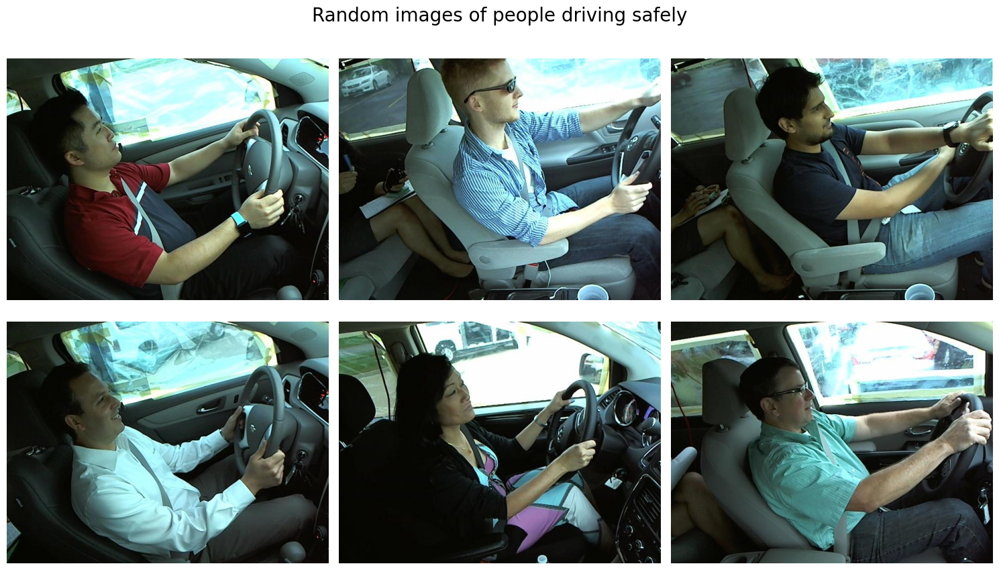

In [6]:
random_images(safe_imgs, "people driving safely")

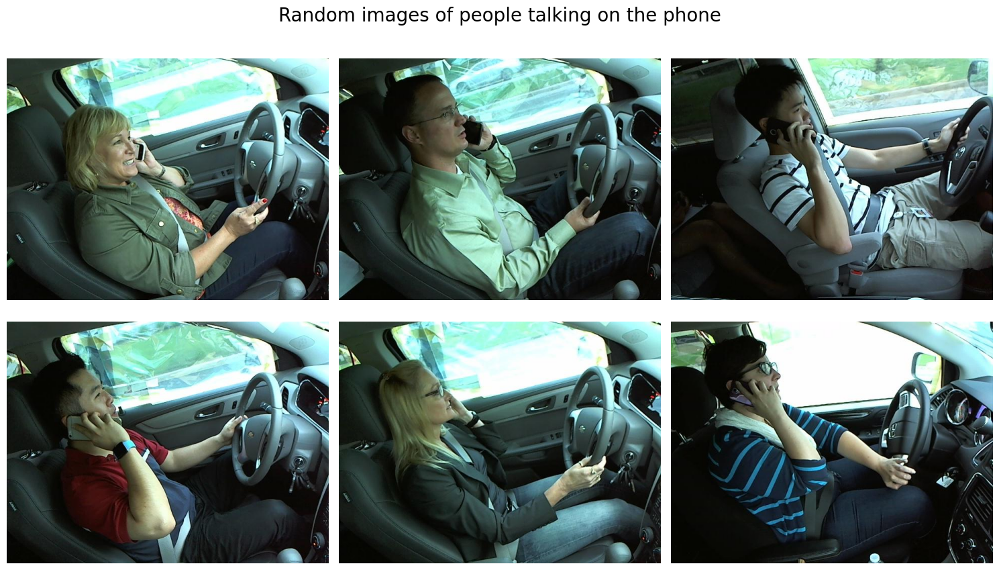

In [7]:
random_images(talking_imgs, "people talking on the phone")

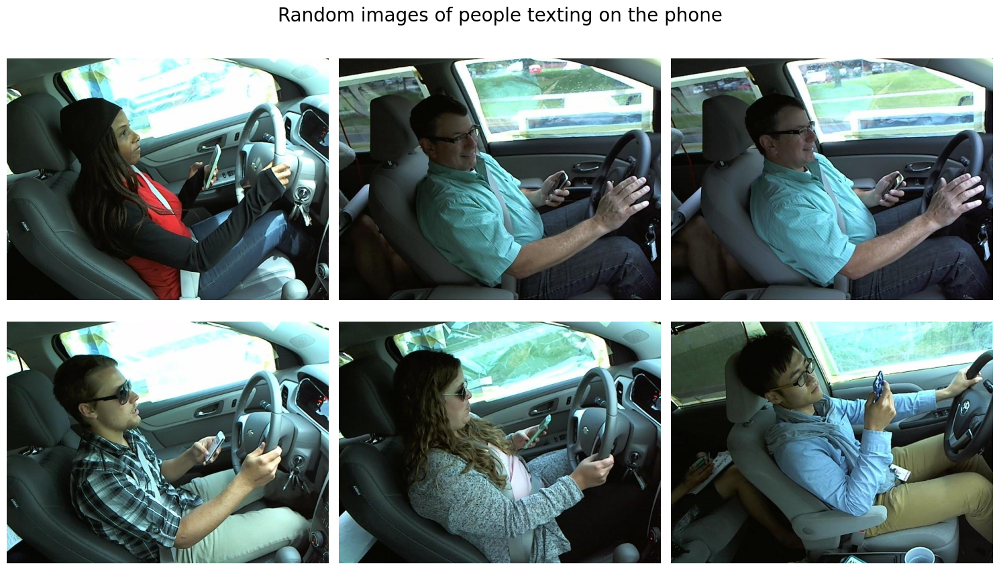

In [8]:
random_images(texting_imgs, "people texting on the phone")

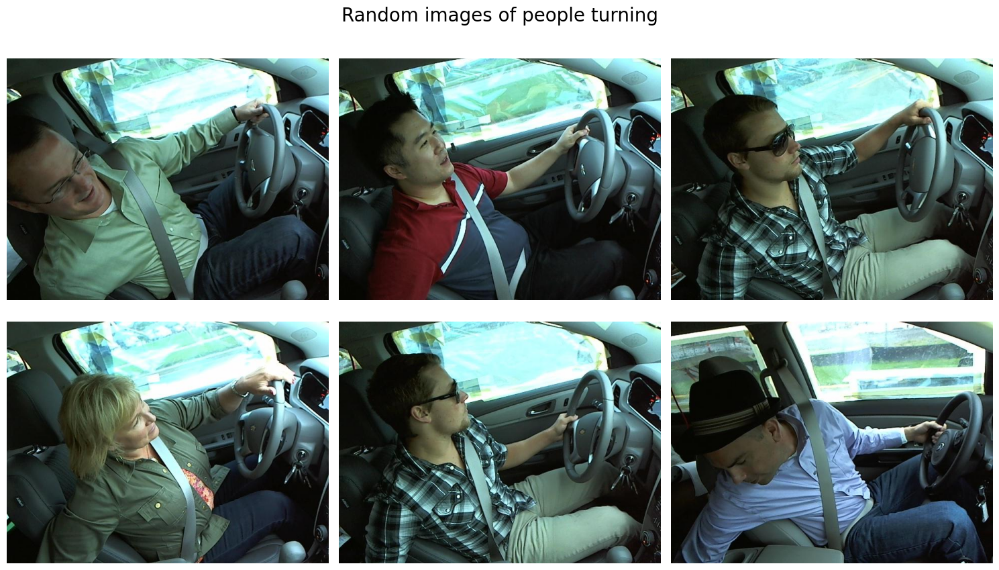

In [9]:
random_images(turning_imgs, "people turning")

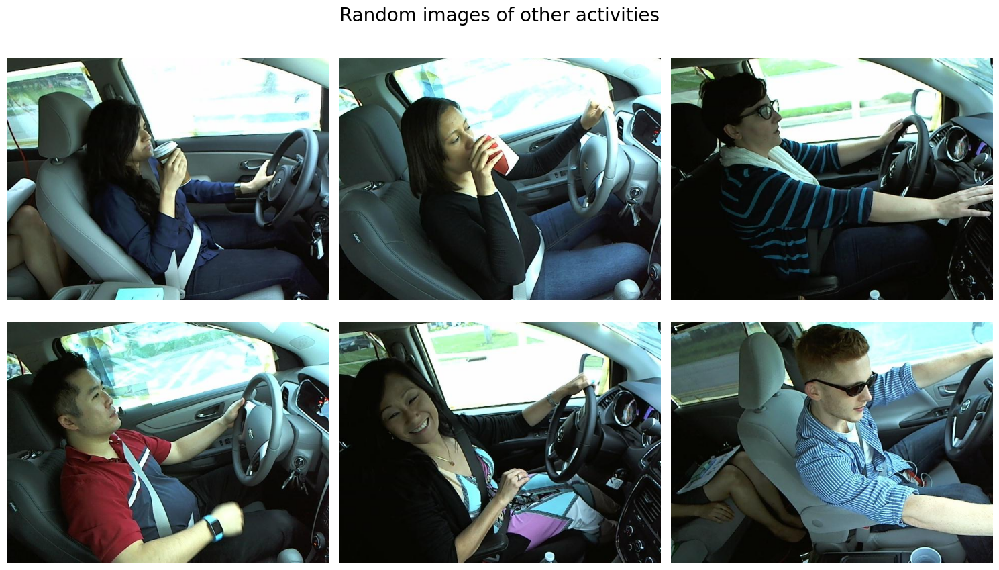

In [10]:
random_images(other_imgs, "other activities")

### Phân chia dữ liệu & gắn label
- Tỉ lệ: (train, test, valid) = (70 : 15 : 15)

In [11]:
def create_df(img_list, label):
    df = pd.DataFrame({'image': img_list, 'label': label})
    return df

In [12]:
def split_data(img_list, label):
    train_imgs, test_imgs = train_test_split(img_list, test_size=0.15, random_state=42)
    train_imgs, valid_imgs = train_test_split(train_imgs, test_size=0.1765, random_state=42)
    return create_df(train_imgs, label), create_df(test_imgs, label), create_df(valid_imgs, label)

In [13]:
train_safe_df, test_safe_df, valid_safe_df = split_data(safe_imgs, 'Safe')
train_talking_df, test_talking_df, valid_talking_df = split_data(talking_imgs, 'Talking')
train_texting_df, test_texting_df, valid_texting_df = split_data(texting_imgs, 'Texting')
train_turning_df, test_turning_df, valid_turning_df = split_data(turning_imgs, 'Turning')
train_other_df, test_other_df, valid_other_df = split_data(other_imgs, 'Other')

In [14]:
split_results = {
    'Dataset': ['Train', 'Test', 'Validation'],
    'Safe': [len(train_safe_df), len(test_safe_df), len(valid_safe_df)],
    'Talk': [len(train_talking_df), len(test_talking_df), len(valid_talking_df)],
    'Text': [len(train_texting_df), len(test_texting_df), len(valid_texting_df)],
    'Turn': [len(train_turning_df), len(test_turning_df), len(valid_turning_df)],
    'Other': [len(train_other_df), len(test_other_df), len(valid_other_df)]
}

df_split_results = pd.DataFrame(split_results)
df_split_results

,Dataset,Safe,Talk,Text,Turn,Other
0,Train,1541,1517,1541,1443,1488
1,Test,331,326,331,310,320
2,Validation,331,326,331,310,320


In [15]:
train_df = pd.concat([train_safe_df, train_talking_df, train_texting_df, train_turning_df, train_other_df], ignore_index=True)
test_df = pd.concat([test_safe_df, test_talking_df, test_texting_df, test_turning_df, test_other_df], ignore_index=True)
valid_df = pd.concat([valid_safe_df, valid_talking_df, valid_texting_df, valid_turning_df, valid_other_df], ignore_index=True)

In [16]:
train_df.head(5)

,image,label
0,/kaggle/input/revitsone-5class/Revitsone-5clas...,Safe
1,/kaggle/input/revitsone-5class/Revitsone-5clas...,Safe
2,/kaggle/input/revitsone-5class/Revitsone-5clas...,Safe
3,/kaggle/input/revitsone-5class/Revitsone-5clas...,Safe
4,/kaggle/input/revitsone-5class/Revitsone-5clas...,Safe


### Tiền xử lý dữ liệu
- Loại bỏ ảnh mờ, nhiễu, lỗi
- Kiểm tra kích thước
- Tạo Dataset từ các DataFrame chứa thông tin về hình ảnh và label

#### Loại bỏ ảnh mờ, nhiễu, lỗi

In [17]:
def is_blurry(image_path, threshold=100):
    image = cv2.imread(image_path)
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    laplacian_var = cv2.Laplacian(gray, cv2.CV_64F).var()
    return laplacian_var < threshold

In [18]:
def remove_invalid_images(df, threshold=100):
    invalid_images = []
    for image_path in df['image']:
        try:
            # Kiểm tra nếu ảnh mở được
            img = Image.open(image_path)
            img.verify()  # Xác minh ảnh hợp lệ
            
            # Kiểm tra nếu ảnh bị mờ
            if is_blurry(image_path, threshold):
                print(f"Image is blurry: {image_path}")
                invalid_images.append(image_path)
        except Exception as e:
            print(f"Error opening image: {image_path}")
            invalid_images.append(image_path)
    
    df = df[~df['image'].isin(invalid_images)]
    return df

In [19]:
train_df = remove_invalid_images(train_df)
test_df = remove_invalid_images(test_df)
valid_df = remove_invalid_images(valid_df)

Image is blurry: /kaggle/input/revitsone-5class/Revitsone-5classes/safe_driving/img_7276.jpg
Image is blurry: /kaggle/input/revitsone-5class/Revitsone-5classes/safe_driving/img_31355.jpg
Image is blurry: /kaggle/input/revitsone-5class/Revitsone-5classes/safe_driving/img_27005.jpg
Image is blurry: /kaggle/input/revitsone-5class/Revitsone-5classes/safe_driving/img_62307.jpg
Image is blurry: /kaggle/input/revitsone-5class/Revitsone-5classes/safe_driving/img_57869.jpg
Image is blurry: /kaggle/input/revitsone-5class/Revitsone-5classes/safe_driving/img_11914.jpg
Image is blurry: /kaggle/input/revitsone-5class/Revitsone-5classes/talking_phone/img_4008.jpg
Image is blurry: /kaggle/input/revitsone-5class/Revitsone-5classes/talking_phone/img_34796.jpg
Image is blurry: /kaggle/input/revitsone-5class/Revitsone-5classes/talking_phone/img_44101.jpg
Image is blurry: /kaggle/input/revitsone-5class/Revitsone-5classes/texting_phone/img_26837.jpg
Error opening image: /kaggle/input/revitsone-5class/Revits

#### Kiểm tra kích thước

In [20]:
random_img = random.choice(train_df['image'])

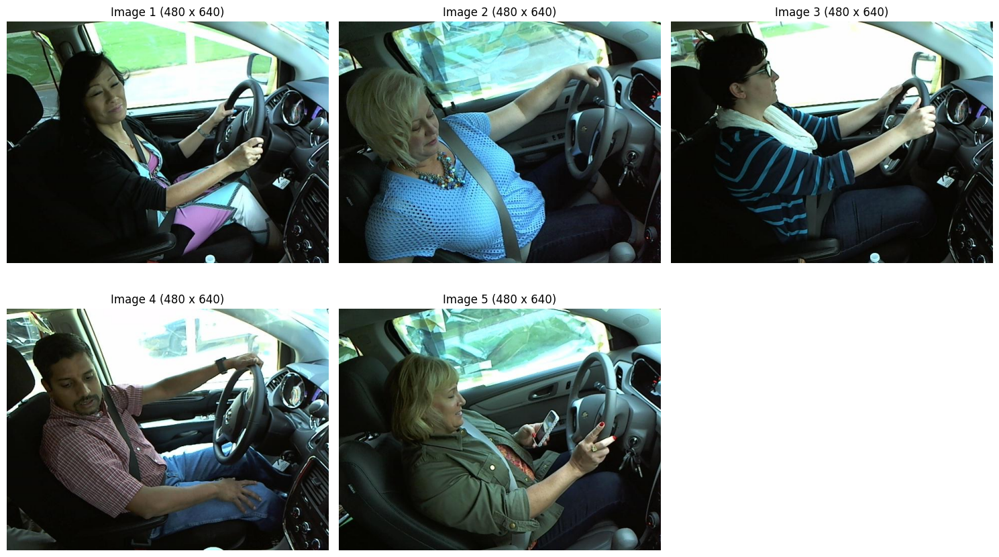

In [21]:
plt.figure(figsize=(15, 9))

for i in range(5):
    random_imgs = random.choice(train_df['image'])
    image = cv2.imread(random_imgs)
    height, width = image.shape[:2]
    
    plt.subplot(2, 3, i+1)
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.title(f"Image {i+1} ({height} x {width})")
    plt.axis('off')

plt.tight_layout()
plt.show()

#### Tăng cường dữ liệu (data augmentation) & Chuấn hoá (normalization)
- Tạo các đối tượng ImageDataGenerator để thực hiện các biến đổi dữ liệu trên 3 tập train, test, valid.
  
- Chuẩn hoá giá trị pixel của ảnh về khoảng [0,1].

- Tăng cường dữ liệu:

| Tham số            | Giá trị               | Mô tả                                                                             |
|--------------------|-----------------------|-----------------------------------------------------------------------------------|
| rescale            | 1./255                | Chuẩn hóa giá trị pixel về khoảng [0, 1]                                          |
| rotation_range     | 0-15 độ               | Xoay ngẫu nhiên ảnh từ 0 đến 15 độ                                                |
| width_shift_range  | 0-10% chiều rộng      | Dịch chuyển ngẫu nhiên ảnh theo chiều ngang từ 0 đến 10% chiều rộng               |
| height_shift_range | 0-10% chiều cao       | Dịch chuyển ngẫu nhiên ảnh theo chiều dọc từ 0 đến 10% chiều cao                  |
| shear_range        | 0-0.01 radian         | Biến đổi trượt với góc tối đa là 0.01 radian                                      |
| zoom_range         | 0.9-1.25 lần          | Phóng to/thu nhỏ ngẫu nhiên ảnh từ 0.9 đến 1.25 lần                               |
| horizontal_flip    | True                  | Lật ngẫu nhiên ảnh theo chiều ngang                                               |
| fill_mode          | 'reflect'             | Lấp đầy các pixel mới bằng cách phản chiếu các pixel gần nhất                     |
| brightness_range   | 0.5-1.5               | Điều chỉnh ngẫu nhiên độ sáng                                                     |


In [22]:
batch_size = 64 # Mạng sẽ cập nhật trọng số sau mỗi 64 mẫu dữ liệu
img_height = 224
img_width = 224

In [23]:
train_generator = ImageDataGenerator(
    rescale=1./255,
    rotation_range=15,
    width_shift_range=0.1,
    height_shift_range=0.1,
    shear_range=0.01,
    zoom_range=[0.9, 1.25],
    horizontal_flip=True,
    vertical_flip=False,
    fill_mode='reflect',
    data_format='channels_last',
    brightness_range=[0.5, 1.5]
)

val_test_generator = ImageDataGenerator(rescale=1./255)

#### Tạo Dataset từ DataFrame
- Sử dụng phương thức flow_from_dataframe() của ImageDataGenerator
- class_mode: Loại của nhãn. "categorical": one-hot encoding.
- x_col: Tên cột chứa đường dẫn đến ảnh.
- y_col: Tên cột chứa nhãn của ảnh.

In [24]:
train_dataset = train_generator.flow_from_dataframe(
  dataframe=train_df,
  class_mode="categorical",
  x_col="image",
  y_col="label",
  batch_size=batch_size,
  seed=42,
  shuffle=True,
  target_size=(img_height, img_width)
)

Found 7511 validated image filenames belonging to 5 classes.


In [25]:
test_dataset = val_test_generator.flow_from_dataframe(
  dataframe=test_df,
  class_mode='categorical',
  x_col="image",
  y_col="label",
  batch_size=batch_size,
  seed=42,
  shuffle=True,
  target_size=(img_height, img_width)
)

Found 1613 validated image filenames belonging to 5 classes.


In [26]:
val_dataset = val_test_generator.flow_from_dataframe(
  dataframe=valid_df,
  class_mode='categorical',
  x_col="image",
  y_col="label",
  batch_size=batch_size,
  seed=42,
  shuffle=True,
  target_size=(img_height, img_width)
)

Found 1615 validated image filenames belonging to 5 classes.


##### Lấy một batch dữ liệu từ train_dataset

Shape of images batch: (64, 224, 224, 3)
Shape of labels batch: (64, 5)


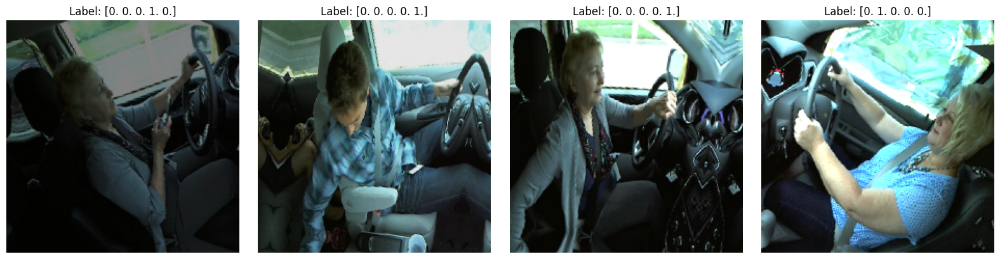

In [27]:
images, labels = next(train_dataset)

print("Shape of images batch:", images.shape)
print("Shape of labels batch:", labels.shape)

num_examples = 4
num_rows = 1
num_cols = num_examples

plt.figure(figsize=(16, 4))

for i in range(num_examples):
    plt.subplot(num_rows, num_cols, i+1)
    plt.imshow(images[i])
    plt.title(f"Label: {labels[i]}")
    plt.axis("off")

plt.tight_layout()
plt.show()

## Xây dựng mô hình

### AlexNet

- Được giới thiệu năm 2012, sử dụng chủ yếu cho các tác vụ nhận dạng và phân loại hình ảnh.

- Cấu trúc gồm 8 lớp:

    - 5 lớp đầu tiên: các lớp tích chập (convolutional layers), một số được theo sau bởi các lớp tổng hợp tối đa (max-pooling layers).

    - 3 lớp sau: các lớp được kết nối đầy đủ (fully connected layers).

- AlexNet sử dụng các hàm kích hoạt ReLU và điều chuẩn dropout (dropout regularization) để ngăn chặn quá khớp (overfitting).

#### Thiết lập mô hình

In [28]:
def conv_block(x, filters, kernel_size, strides, activation='relu'):
    x = layers.Conv2D(filters, kernel_size, strides, activation=activation)(x)
    x = layers.BatchNormalization()(x)
    return x

def AlexNet():
    input_layer = layers.Input((224, 224, 3))
    
    # Convolutional layers
    x = conv_block(input_layer, filters=96, kernel_size=11, strides=4)
    x = layers.MaxPooling2D(3, 2)(x)
    
    x = conv_block(x, filters=256, kernel_size=5, strides=1)
    x = layers.MaxPooling2D(3, 2)(x)
    
    x = conv_block(x, filters=384, kernel_size=3, strides=1)
    x = conv_block(x, filters=384, kernel_size=3, strides=1)
    x = conv_block(x, filters=256, kernel_size=3, strides=1)
    x = layers.MaxPooling2D(3, 2)(x)
    
    # Flatten and fully connected layers
    x = layers.Flatten()(x)
    x = layers.Dense(4096, activation='relu')(x)
    x = layers.Dropout(0.5)(x)
    x = layers.Dense(4096, activation='relu')(x)
    x = layers.Dropout(0.5)(x)
    
    # Output layer
    output_layer = layers.Dense(5, activation='softmax')(x)

    model = models.Model(inputs=input_layer, outputs=output_layer)

    return model

In [29]:
alex_model = AlexNet()
alex_model.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, 54, 54, 96)     │        34,944 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 54, 54, 96)     │           384 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 26, 26, 96)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 22, 22, 256)    │       614,656 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 22, 22, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 10, 10, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 8, 8, 384)      │       885,120 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 8, 8, 384)      │         1,536 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 6, 6, 384)      │     1,327,488 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 6, 6, 384)      │         1,536 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 4, 4, 256)      │       884,992 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 4, 4, 256)      │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 1, 1, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 4096)           │     1,052,672 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 4096)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 4096)           │    16,781,312 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 4096)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 5)              │        20,485 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 21,607,173 (82.42 MB)

 Trainable params: 21,604,421 (82.41 MB)

 Non-trainable params: 2,752 (10.75 KB)

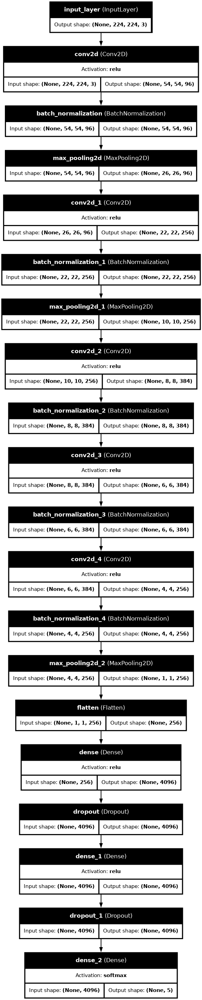

In [30]:
plot_model(
    alex_model,
    to_file='alex_model.png',
    show_shapes=True,
    show_dtype=False,
    show_layer_names=True,
    show_layer_activations=True,
    dpi=75
)

#### Các tham số

- optimizer: Adam, với learning rate = 0.001. Adam là một thuật toán tối ưu hóa phổ biến trong deep learning với khả năng tự điều chỉnh tỷ lệ học.

- loss_function: Binary Crossentropy, thích hợp cho bài toán phân loại nhị phân

- metrics: accuracy (tỉ lệ dự đoán chính xác của mô hình)

In [31]:
optimizer = Adam(learning_rate=0.001)
loss_function = CategoricalCrossentropy()
metrics = ['accuracy', 'Precision', 'Recall']

- Điều chỉnh learning rate: ReduceLROnPlateau giảm tốc độ học theo hệ số factor (= 0.1) nếu giá trị của val_loss không cải thiện sau 3 epoch (patience = 3). Thiết đặt min_lr (tốc độ học tối thiểu).

In [32]:
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=3, min_lr=0.00001, verbose=1)

In [33]:
alex_model.compile(loss=loss_function, optimizer=optimizer, metrics=metrics)

#### Huấn luyện mô hình

In [34]:
num_epochs = 20

history = alex_model.fit(train_dataset, epochs=num_epochs, 
                         validation_data=val_dataset, callbacks=[reduce_lr])

Epoch 1/20
  2/118 ━━━━━━━━━━━━━━━━━━━━ 8s 75ms/step - Precision: 0.0784 - Recall: 0.0312 - accuracy: 0.1875 - loss: 2.2735          

I0000 00:00:1717881832.158946      77 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.
W0000 00:00:1717881832.183456      77 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


117/118 ━━━━━━━━━━━━━━━━━━━━ 0s 932ms/step - Precision: 0.2043 - Recall: 0.0565 - accuracy: 0.2124 - loss: 2.3286

W0000 00:00:1717881942.319954      79 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


118/118 ━━━━━━━━━━━━━━━━━━━━ 143s 1s/step - Precision: 0.2044 - Recall: 0.0560 - accuracy: 0.2126 - loss: 2.3207 - val_Precision: 0.0000e+00 - val_Recall: 0.0000e+00 - val_accuracy: 0.2241 - val_loss: 1.6109 - learning_rate: 0.0010
Epoch 2/20


W0000 00:00:1717881950.116490      76 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


118/118 ━━━━━━━━━━━━━━━━━━━━ 115s 915ms/step - Precision: 0.3635 - Recall: 0.0221 - accuracy: 0.2736 - loss: 1.5669 - val_Precision: 0.2682 - val_Recall: 0.1938 - val_accuracy: 0.2161 - val_loss: 2.3011 - learning_rate: 0.0010
Epoch 3/20
118/118 ━━━━━━━━━━━━━━━━━━━━ 115s 917ms/step - Precision: 0.5625 - Recall: 0.1558 - accuracy: 0.3939 - loss: 1.3944 - val_Precision: 0.3271 - val_Recall: 0.2272 - val_accuracy: 0.2879 - val_loss: 2.0268 - learning_rate: 0.0010
Epoch 4/20
118/118 ━━━━━━━━━━━━━━━━━━━━ 0s 864ms/step - Precision: 0.6395 - Recall: 0.3163 - accuracy: 0.4932 - loss: 1.2062
Epoch 4: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.
118/118 ━━━━━━━━━━━━━━━━━━━━ 114s 915ms/step - Precision: 0.6397 - Recall: 0.3167 - accuracy: 0.4935 - loss: 1.2055 - val_Precision: 0.4097 - val_Recall: 0.3133 - val_accuracy: 0.3814 - val_loss: 1.7297 - learning_rate: 0.0010
Epoch 5/20
118/118 ━━━━━━━━━━━━━━━━━━━━ 115s 920ms/step - Precision: 0.7721 - Recall: 0.5563 - accuracy: 0

#### Lưu lại mô hình

In [35]:
alex_model.save('alex_model.h5')
FileLink(r'alex_model.h5')

/kaggle/working/alex_model.h5

#### Đánh giá

In [36]:
train_loss_alex = history.history['loss']
valid_loss_alex = history.history['val_loss']
train_accuracy_alex = history.history['accuracy']
valid_accuracy_alex = history.history['val_accuracy']

epoch_count = range(1, len(train_loss_alex) + 1)

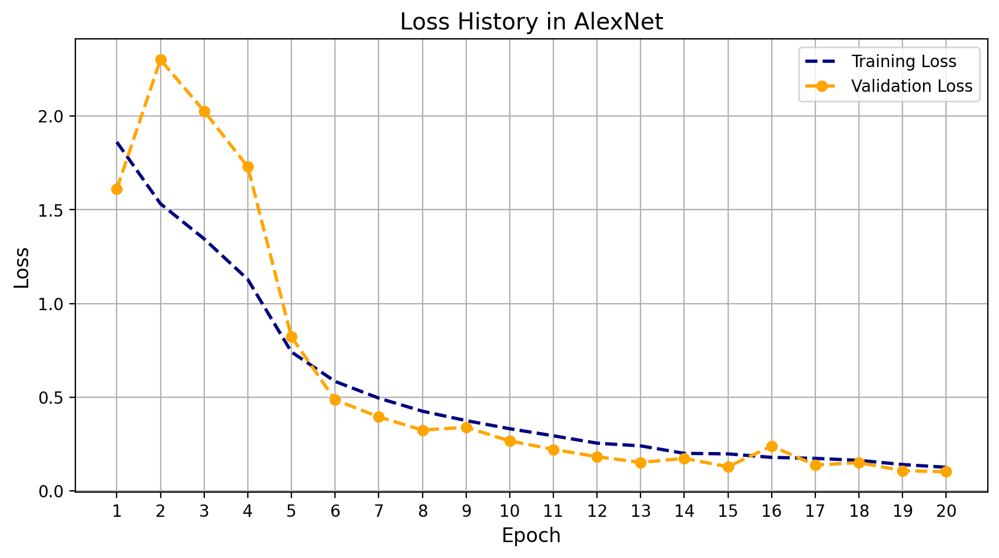

In [37]:
plt.figure(figsize=(10, 5), dpi=200)

plt.plot(epoch_count, train_loss_alex, 'r--', color='navy', label='Training Loss', linewidth=2)
plt.plot(epoch_count, valid_loss_alex, '--bo', color='orange', label='Validation Loss', linewidth=2)

plt.title('Loss History in AlexNet', fontsize=14)
plt.xlabel('Epoch', fontsize=12)
plt.ylabel('Loss', fontsize=12)

plt.grid(True)
plt.legend(loc='upper right')

plt.xticks(np.arange(1, 21, 1))

plt.show()

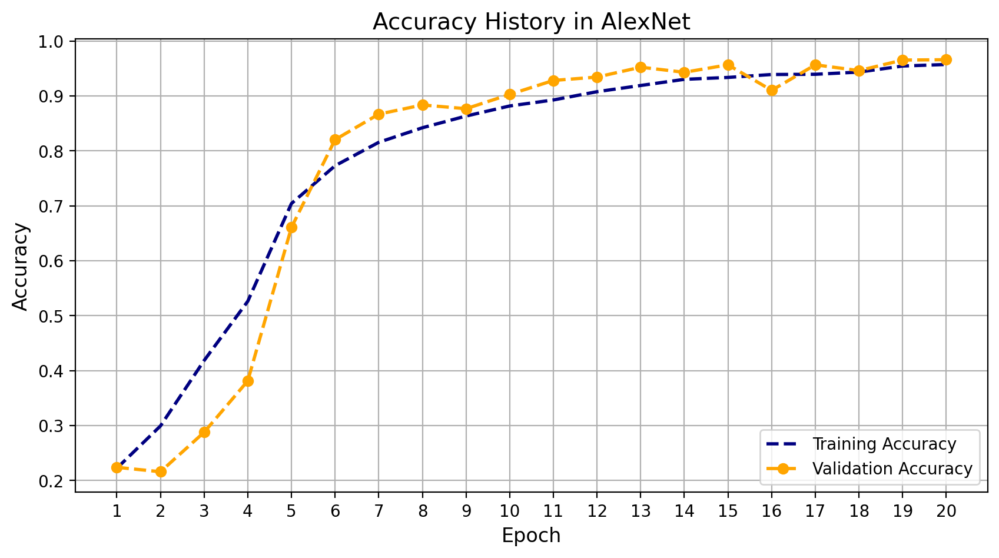

In [38]:
plt.figure(figsize=(10, 5), dpi=200)

plt.plot(epoch_count, train_accuracy_alex, 'r--', color='navy', label='Training Accuracy', linewidth=2)
plt.plot(epoch_count, valid_accuracy_alex, '--bo', color='orange', label='Validation Accuracy', linewidth=2)

plt.title('Accuracy History in AlexNet', fontsize=14)
plt.xlabel('Epoch', fontsize=12)
plt.ylabel('Accuracy', fontsize=12)

plt.grid(True)
plt.legend(loc='lower right')

plt.xticks(np.arange(1, 21, 1))

plt.show()

In [39]:
predictions_alex = alex_model.predict(test_dataset)

 1/26 ━━━━━━━━━━━━━━━━━━━━ 21s 879ms/step

W0000 00:00:1717884196.329525      78 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


26/26 ━━━━━━━━━━━━━━━━━━━━ 9s 344ms/step


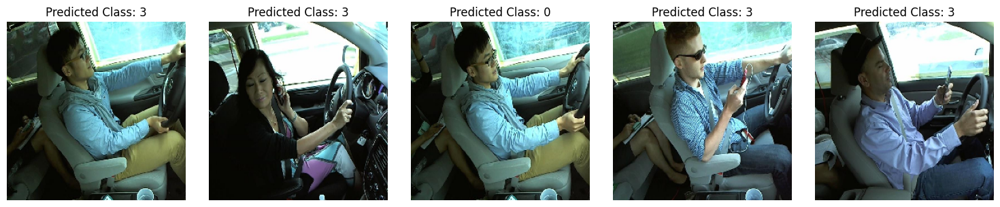

In [40]:
num_images = 5
random_indices = random.sample(range(len(test_dataset)), num_images)

num_rows = 1
num_cols = num_images

fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 3))

for i, idx in enumerate(random_indices):
    image, label = test_dataset[idx]
    prediction = predictions_alex[idx]
    
    ax = axes[i]
    ax.imshow(image[0]) 
    ax.axis('off')  
    
    predicted_class = np.argmax(prediction)
    
    ax.set_title(f'Predicted Class: {predicted_class}')

plt.tight_layout()
plt.show()

In [41]:
def plot_sensitivity_specificity(predictions_model):
    predictions = np.argmax(predictions_model, axis=1)

    true_labels = test_dataset.labels

    conf_matrix = confusion_matrix(true_labels, predictions)
    
    sensitivity = conf_matrix[1, 1] / (conf_matrix[1, 0] + conf_matrix[1, 1])
    specificity = conf_matrix[0, 0] / (conf_matrix[0, 0] + conf_matrix[0, 1])
    
    return conf_matrix, sensitivity, specificity

In [42]:
conf_matrix, sensitivity, specificity = plot_sensitivity_specificity(predictions_alex)
print("Sensitivity:", sensitivity)
print("Specificity:", specificity)

Sensitivity: 0.5190839694656488
Specificity: 0.5263157894736842


In [44]:
evaluation_alex = alex_model.evaluate(test_dataset)

26/26 ━━━━━━━━━━━━━━━━━━━━ 8s 308ms/step - Precision: 0.9745 - Recall: 0.9625 - accuracy: 0.9654 - loss: 0.1010


In [45]:
eval_dict_alex = {metric_name: evaluation_value for metric_name, evaluation_value in zip(alex_model.metrics_names, evaluation_alex)}
eval_df_alex = pd.DataFrame([eval_dict_alex])

print("Evaluation metrics:")
eval_df_alex

Evaluation metrics:


,loss,compile_metrics
0,0.105028,0.962802


### VGGNet (Visual Geometry Group)

- Là một trong những kiến trúc nhận dạng hình ảnh phổ biến nhất hiện nay.

- Là một CNN sâu với nhiều lớp. VGG-16 hoặc VGG-19 lần lượt bao gồm 16 và 19 lớp tích chập (convolutional layers).

- Kiến trúc VGG là cơ sở của các mô hình nhận dạng đối tượng. Được phát triển như một mạng nơ-ron sâu (deep neural network), VGGNet vượt trội trong nhiều nhiệm vụ và tập dữ liệu ngoài ImageNet.

#### Thiết lập mô hình

In [46]:
def conv_block(x, filters, kernel_size, strides, activation='relu'):
    x = layers.Conv2D(filters, kernel_size, strides, activation=activation)(x)
    x = layers.BatchNormalization()(x)
    return x
    
def VGG16():
    input_layer = layers.Input((224, 224, 3))

    # Block 1
    x = conv_block(input_layer, filters=64, kernel_size=3, strides=1)
    x = conv_block(x, filters=64, kernel_size=3, strides=1)
    x = layers.MaxPooling2D(2, 2)(x)

    # Block 2
    x = conv_block(x, filters=128, kernel_size=3, strides=1)
    x = conv_block(x, filters=128, kernel_size=3, strides=1)
    x = layers.MaxPooling2D(2, 2)(x)

    # Block 3
    x = conv_block(x, filters=256, kernel_size=3, strides=1)
    x = conv_block(x, filters=256, kernel_size=3, strides=1)
    x = conv_block(x, filters=256, kernel_size=3, strides=1)
    x = layers.MaxPooling2D(2, 2)(x)

    # Block 4
    x = conv_block(x, filters=512, kernel_size=3, strides=1)
    x = conv_block(x, filters=512, kernel_size=3, strides=1)
    x = conv_block(x, filters=512, kernel_size=3, strides=1)
    x = layers.MaxPooling2D(2, 2)(x)

    # Block 5
    x = conv_block(x, filters=512, kernel_size=3, strides=1)
    x = conv_block(x, filters=512, kernel_size=3, strides=1)
    x = conv_block(x, filters=512, kernel_size=3, strides=1)
    x = layers.MaxPooling2D(2, 2)(x)

    # Flatten and fully connected layers
    x = layers.Flatten()(x)
    x = layers.Dense(4096, activation='relu')(x)
    x = layers.Dropout(0.5)(x)
    x = layers.Dense(4096, activation='relu')(x)
    x = layers.Dropout(0.5)(x)
    
    # Output layer
    output_layer = layers.Dense(5, activation='softmax')(x)

    model = models.Model(inputs=input_layer, outputs=output_layer)

    return model

In [47]:
vgg16_model = VGG16()
vgg16_model.summary()

Model: "functional_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 222, 222, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_5           │ (None, 222, 222, 64)   │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 220, 220, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_6           │ (None, 220, 220, 64)   │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 110, 110, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 108, 108, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_7           │ (None, 108, 108, 128)  │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_8 (Conv2D)               │ (None, 106, 106, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_8           │ (None, 106, 106, 128)  │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 53, 53, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_9 (Conv2D)               │ (None, 51, 51, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_9           │ (None, 51, 51, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_10 (Conv2D)              │ (None, 49, 49, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_10          │ (None, 49, 49, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_11 (Conv2D)              │ (None, 47, 47, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_11          │ (None, 47, 47, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_5 (MaxPooling2D)  │ (None, 23, 23, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_12 (Conv2D)              │ (None, 21, 21, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_12          │ (None, 21, 21, 512)    │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_13 (Conv2D)              │ (None, 19, 19, 512)    │     2,359,80

 Total params: 33,634,629 (128.31 MB)

 Trainable params: 33,626,181 (128.27 MB)

 Non-trainable params: 8,448 (33.00 KB)

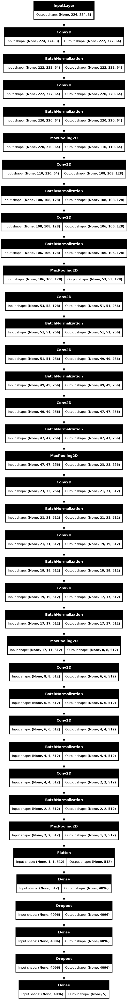

In [48]:
layer_outputs = [layer.output for layer in vgg16_model.layers[:50]]
sub_model = Model(inputs=vgg16_model.input, outputs=layer_outputs)

plot_model(sub_model, to_file='vgg16_model.png', show_shapes=True, dpi=75)

#### Các tham số

In [49]:
optimizer = Adam(learning_rate=0.001)
loss_function = CategoricalCrossentropy()
metrics = ['accuracy', 'Precision', 'Recall']

In [50]:
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=3, min_lr=0.00001, verbose=1)

In [51]:
vgg16_model.compile(loss=loss_function, optimizer=optimizer, metrics=metrics)

#### Huấn luyện mô hình

In [52]:
num_epochs = 20

history_vgg = vgg16_model.fit(train_dataset, epochs=num_epochs, 
                         validation_data=val_dataset, callbacks=[reduce_lr])

Epoch 1/20


W0000 00:00:1717884404.315941      77 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


 17/118 ━━━━━━━━━━━━━━━━━━━━ 1:44 1s/step - Precision: 0.2015 - Recall: 0.1353 - accuracy: 0.2003 - loss: 4.2961

W0000 00:00:1717884492.104627      76 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


118/118 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - Precision: 0.2118 - Recall: 0.0676 - accuracy: 0.2164 - loss: 2.5488

W0000 00:00:1717884587.505473      76 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


118/118 ━━━━━━━━━━━━━━━━━━━━ 380s 2s/step - Precision: 0.2119 - Recall: 0.0673 - accuracy: 0.2165 - loss: 2.5437 - val_Precision: 0.1994 - val_Recall: 0.0873 - val_accuracy: 0.2149 - val_loss: 1.9200 - learning_rate: 0.0010
Epoch 2/20
118/118 ━━━━━━━━━━━━━━━━━━━━ 123s 984ms/step - Precision: 0.3896 - Recall: 0.0460 - accuracy: 0.3004 - loss: 1.5771 - val_Precision: 0.1801 - val_Recall: 0.1628 - val_accuracy: 0.1870 - val_loss: 2.0532 - learning_rate: 0.0010
Epoch 3/20
118/118 ━━━━━━━━━━━━━━━━━━━━ 125s 996ms/step - Precision: 0.6286 - Recall: 0.2259 - accuracy: 0.4465 - loss: 1.3252 - val_Precision: 0.2500 - val_Recall: 0.1870 - val_accuracy: 0.2254 - val_loss: 2.8799 - learning_rate: 0.0010
Epoch 4/20
118/118 ━━━━━━━━━━━━━━━━━━━━ 124s 987ms/step - Precision: 0.7054 - Recall: 0.4494 - accuracy: 0.5870 - loss: 1.0641 - val_Precision: 0.6591 - val_Recall: 0.4142 - val_accuracy: 0.5121 - val_loss: 1.2198 - learning_rate: 0.0010
Epoch 5/20
118/118 ━━━━━━━━━━━━━━━━━━━━ 128s 1s/step - Precisi

#### Lưu lại mô hình

In [53]:
vgg16_model.save('vgg16_model.h5')
FileLink(r'vgg16_model.h5')

/kaggle/working/vgg16_model.h5

#### Đánh giá

In [54]:
train_loss_vgg16 = history_vgg.history['loss']
valid_loss_vgg16 = history_vgg.history['val_loss']
train_accuracy_vgg16 = history_vgg.history['accuracy']
valid_accuracy_vgg16 = history_vgg.history['val_accuracy']

epoch_count = range(1, len(train_loss_vgg16) + 1)

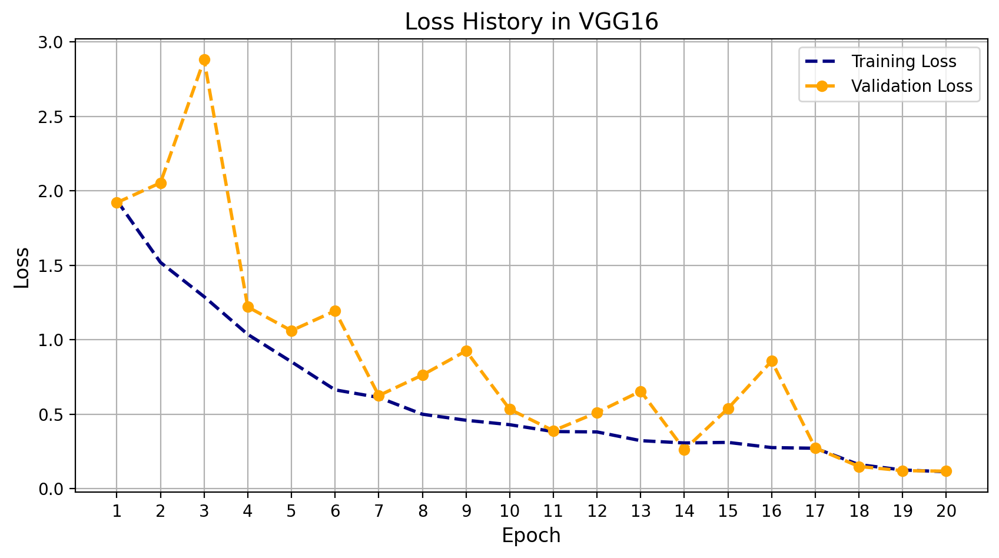

In [55]:
plt.figure(figsize=(10, 5), dpi=200)

plt.plot(epoch_count, train_loss_vgg16, 'r--', color='navy', label='Training Loss', linewidth=2)
plt.plot(epoch_count, valid_loss_vgg16, '--bo', color='orange', label='Validation Loss', linewidth=2)

plt.title('Loss History in VGG16', fontsize=14)
plt.xlabel('Epoch', fontsize=12)
plt.ylabel('Loss', fontsize=12)

plt.grid(True)
plt.legend(loc='upper right')

plt.xticks(np.arange(1, 21, 1))

plt.show()

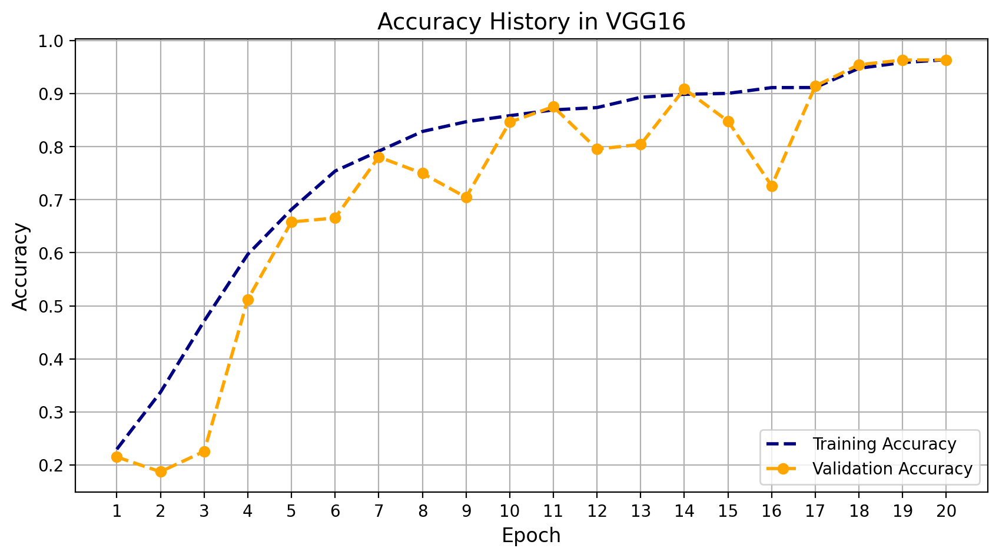

In [56]:
plt.figure(figsize=(10, 5), dpi=200)

plt.plot(epoch_count, train_accuracy_vgg16, 'r--', color='navy', label='Training Accuracy', linewidth=2)
plt.plot(epoch_count, valid_accuracy_vgg16, '--bo', color='orange', label='Validation Accuracy', linewidth=2)

plt.title('Accuracy History in VGG16', fontsize=14)
plt.xlabel('Epoch', fontsize=12)
plt.ylabel('Accuracy', fontsize=12)

plt.grid(True)
plt.legend(loc='lower right')

plt.xticks(np.arange(1, 21, 1))

plt.show()

In [57]:
predictions_vgg = vgg16_model.predict(test_dataset)

 1/26 ━━━━━━━━━━━━━━━━━━━━ 33s 1s/step

W0000 00:00:1717887014.900209      77 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


26/26 ━━━━━━━━━━━━━━━━━━━━ 25s 945ms/step


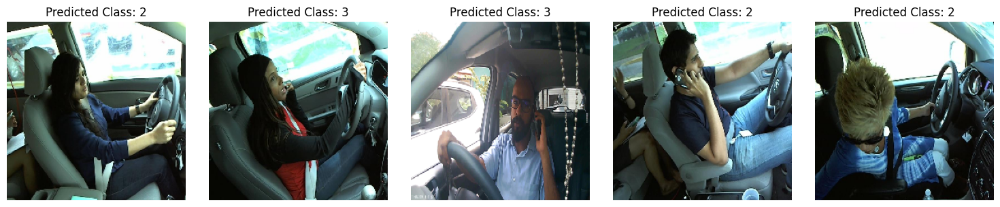

In [58]:
num_images = 5
random_indices = random.sample(range(len(test_dataset)), num_images)

num_rows = 1
num_cols = num_images

fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 3))

for i, idx in enumerate(random_indices):
    image, label = test_dataset[idx]
    prediction = predictions_vgg[idx]
    
    ax = axes[i]
    ax.imshow(image[0]) 
    ax.axis('off')  
    
    predicted_class = np.argmax(prediction)
    
    ax.set_title(f'Predicted Class: {predicted_class}')

plt.tight_layout()
plt.show()

In [59]:
conf_matrix, sensitivity, specificity = plot_sensitivity_specificity(predictions_vgg)
print("Sensitivity:", sensitivity)
print("Specificity:", specificity)

Sensitivity: 0.5323741007194245
Specificity: 0.45901639344262296


In [61]:
evaluation_vgg = vgg16_model.evaluate(test_dataset)

26/26 ━━━━━━━━━━━━━━━━━━━━ 7s 274ms/step - Precision: 0.9867 - Recall: 0.9691 - accuracy: 0.9763 - loss: 0.0817


In [62]:
eval_dict_vgg16 = {metric_name: evaluation_value for metric_name, evaluation_value in zip(vgg16_model.metrics_names, evaluation_vgg)}
eval_df_vgg16 = pd.DataFrame([eval_dict_vgg16])

print("Evaluation metrics:")
eval_df_vgg16

Evaluation metrics:


,loss,compile_metrics
0,0.110058,0.964042


### GoogLeNet
*yeah, not GoogleNet*

- GoogLeNet hay Inception, là một CNN sâu do Google phát triển.

- Điểm đặc biệt: sử dụng một mô-đun được gọi là ***Inception***. Mỗi mô-đun thực hiện nhiều phép tích chập và phép gộp (pooling) với các kích thước bộ lọc khác nhau, sau đó kết hợp các kết quả lại.

- Rất sâu (22 lớp), để học các biểu diễn phức tạp của dữ liệu hình ảnh.
Vẫn đạt hiệu quả tính toán cao nhờ sử dụng các kỹ thuật như global average pooling và 1x1 convolutions.

- Ứng dụng trong phân loại hình ảnh, phát hiện đối tượng, phân đoạn ngữ nghĩa,...

#### Thiết lập mô hình

In [63]:
def conv_block(x, filters, kernel_size, strides, activation='relu'):
    x = layers.Conv2D(filters, kernel_size, strides, padding='same', activation=activation)(x)
    x = layers.BatchNormalization()(x)
    return x

def inception_module(x, filters):
    # Path 1: 1x1 Convolution
    path1 = conv_block(x, filters[0], (1, 1), strides=1)

    # Path 2: 1x1 Convolution followed by 3x3 Convolution
    path2 = conv_block(x, filters[1], (1, 1), strides=1)
    path2 = conv_block(path2, filters[2], (3, 3), strides=1)

    # Path 3: 1x1 Convolution followed by 5x5 Convolution
    path3 = conv_block(x, filters[3], (1, 1), strides=1)
    path3 = conv_block(path3, filters[4], (5, 5), strides=1)

    # Path 4: 3x3 Max Pooling followed by 1x1 Convolution
    path4 = layers.MaxPooling2D((3, 3), strides=(1, 1), padding='same')(x)
    path4 = conv_block(path4, filters[5], (1, 1), strides=1)

    # Concatenate paths
    return layers.concatenate([path1, path2, path3, path4], axis=-1)

def GoogLeNet():
    input_layer = layers.Input((224, 224, 3))

    # Initial Convolutional layer
    x = conv_block(input_layer, 64, (7, 7), strides=(2, 2))
    x = layers.MaxPooling2D((3, 3), strides=(2, 2), padding='same')(x)

    # Inception modules
    x = inception_module(x, [64, 96, 128, 16, 32, 32])
    x = inception_module(x, [128, 128, 192, 32, 96, 64])

    # Max Pooling
    x = layers.MaxPooling2D((3, 3), strides=(2, 2), padding='same')(x)

    # Inception modules
    x = inception_module(x, [192, 96, 208, 16, 48, 64])
    x = inception_module(x, [160, 112, 224, 24, 64, 64])
    x = inception_module(x, [128, 128, 256, 24, 64, 64])
    x = inception_module(x, [112, 144, 288, 32, 64, 64])
    x = inception_module(x, [256, 160, 320, 32, 128, 128])

    # Max Pooling
    x = layers.MaxPooling2D((3, 3), strides=(2, 2), padding='same')(x)

    # Inception modules
    x = inception_module(x, [256, 160, 320, 32, 128, 128])
    x = inception_module(x, [384, 192, 384, 48, 128, 128])

    # Global Average Pooling
    x = layers.GlobalAveragePooling2D()(x)

    # Fully connected layers
    x = layers.Dense(1024, activation='relu')(x)
    x = layers.Dropout(0.4)(x)

    # Output layer
    output_layer = layers.Dense(5, activation='softmax')(x)

    model = models.Model(inputs=input_layer, outputs=output_layer)

    return model

In [64]:
inception_model = GoogLeNet()
inception_model.summary()

Model: "functional_7"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_18 (Conv2D)  │ (None, 112, 112,  │      9,472 │ input_layer_2[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 112, 112,  │        256 │ conv2d_18[0][0]   │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_8     │ (None, 56, 56,    │          0 │ batch_normalizat… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_20 (Conv2D)  │ (None, 56, 56,    │      6,240 │ max_pooling2d_8[… │
│                     │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_22 (Conv2D)  │ (None, 56, 56,    │      1,040 │ max_pooling2d_8[… │
│                     │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 56, 56,    │        384 │ conv2d_20[0][0]   │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 56, 56,    │         64 │ conv2d_22[0][0]   │
│ (BatchNormalizatio… │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_9     │ (None, 56, 56,    │          0 │ max_pooling2d_8[… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_19 (Conv2D)  │ (None, 56, 56,    │      4,160 │ max_pooling2d_8[… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_21 (Conv2D)  │ (None, 56, 56,    │    110,720 │ batch_normalizat… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_23 (Conv2D)  │ (None, 56, 56,    │     12,832 │ batch_normalizat… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_24 (Conv2D)  │ (None, 56, 56,    │      2,080 │ max_pooling2d_9[… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 56, 56,    │        256 │ conv2d_19[0][0]   │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 56, 56,    │        512 │ conv2d_21[0][0]   │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 56, 56,    │        128 │ conv2d_23[0][0]   │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 56, 56,    │        128 │ conv2d_24[0][0] 

 Total params: 6,914,805 (26.38 MB)

 Trainable params: 6,900,757 (26.32 MB)

 Non-trainable params: 14,048 (54.88 KB)

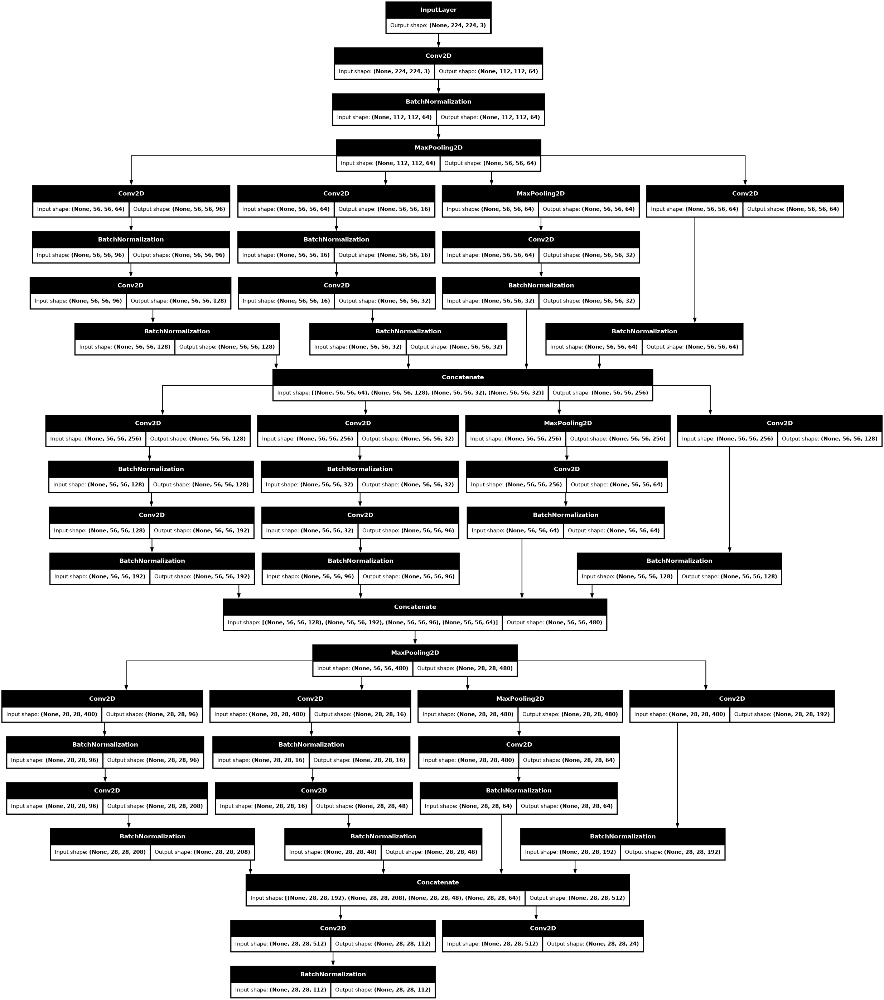

In [65]:
layer_outputs = [layer.output for layer in inception_model.layers[:50]]
sub_model = Model(inputs=inception_model.input, outputs=layer_outputs)

plot_model(sub_model, to_file='inception_model.png', show_shapes=True, dpi=75)

#### Các tham số

In [66]:
optimizer = Adam(learning_rate=0.001)
loss_function = CategoricalCrossentropy()
metrics = ['accuracy', 'Precision', 'Recall']

In [67]:
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=3, min_lr=0.00001, verbose=1)

In [68]:
inception_model.compile(loss=loss_function, optimizer=optimizer, metrics=metrics)

#### Huấn luyện mô hình

In [69]:
num_epochs = 20

history_inception = inception_model.fit(train_dataset, epochs=num_epochs, 
                         validation_data=val_dataset, callbacks=[reduce_lr])

Epoch 1/20


W0000 00:00:1717887227.835918      79 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


 74/118 ━━━━━━━━━━━━━━━━━━━━ 41s 944ms/step - Precision: 0.3139 - Recall: 0.0699 - accuracy: 0.2750 - loss: 1.7072

W0000 00:00:1717887378.479704      76 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


118/118 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - Precision: 0.3775 - Recall: 0.0993 - accuracy: 0.3023 - loss: 1.6541

W0000 00:00:1717887421.665799      78 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


118/118 ━━━━━━━━━━━━━━━━━━━━ 367s 2s/step - Precision: 0.3787 - Recall: 0.0999 - accuracy: 0.3029 - loss: 1.6529 - val_Precision: 0.2050 - val_Recall: 0.2050 - val_accuracy: 0.2050 - val_loss: 7.9524 - learning_rate: 0.0010
Epoch 2/20
118/118 ━━━━━━━━━━━━━━━━━━━━ 122s 972ms/step - Precision: 0.6886 - Recall: 0.4147 - accuracy: 0.5700 - loss: 1.0808 - val_Precision: 0.2084 - val_Recall: 0.2025 - val_accuracy: 0.2105 - val_loss: 5.2416 - learning_rate: 0.0010
Epoch 3/20
118/118 ━━━━━━━━━━━━━━━━━━━━ 121s 966ms/step - Precision: 0.8337 - Recall: 0.7224 - accuracy: 0.7818 - loss: 0.6228 - val_Precision: 0.3119 - val_Recall: 0.3028 - val_accuracy: 0.3059 - val_loss: 4.3800 - learning_rate: 0.0010
Epoch 4/20
118/118 ━━━━━━━━━━━━━━━━━━━━ 121s 971ms/step - Precision: 0.8915 - Recall: 0.8420 - accuracy: 0.8667 - loss: 0.3860 - val_Precision: 0.6558 - val_Recall: 0.6229 - val_accuracy: 0.6353 - val_loss: 1.6111 - learning_rate: 0.0010
Epoch 5/20
118/118 ━━━━━━━━━━━━━━━━━━━━ 122s 976ms/step - Prec

#### Lưu lại mô hình

In [70]:
inception_model.save('inception_model.h5')
FileLink(r'inception_model.h5')

/kaggle/working/inception_model.h5

#### Đánh giá

In [71]:
train_loss_inception = history_inception.history['loss']
valid_loss_inception = history_inception.history['val_loss']
train_accuracy_inception = history_inception.history['accuracy']
valid_accuracy_inception = history_inception.history['val_accuracy']

epoch_count = range(1, len(train_loss_inception) + 1)

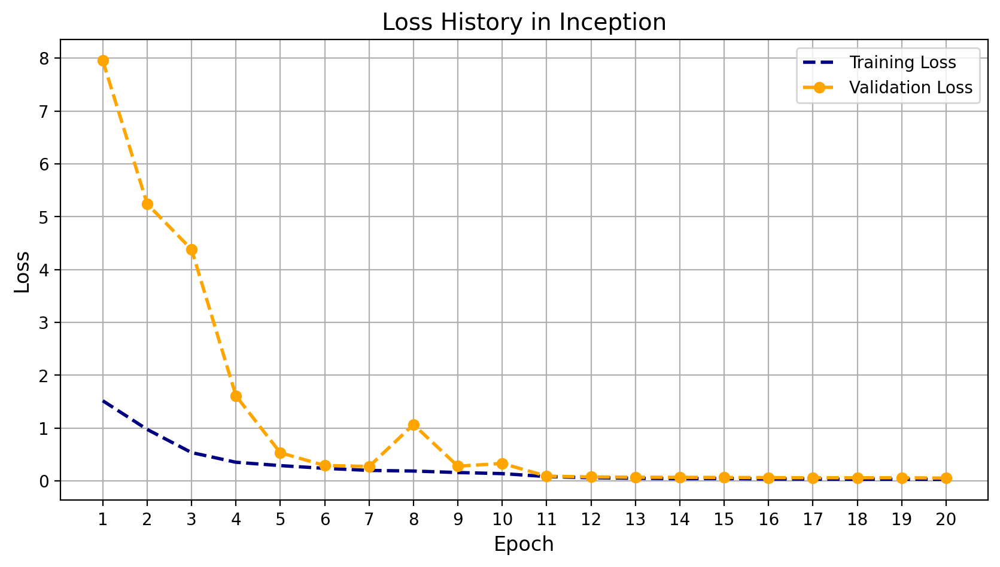

In [72]:
plt.figure(figsize=(10, 5), dpi=200)

plt.plot(epoch_count, train_loss_inception, 'r--', color='navy', label='Training Loss', linewidth=2)
plt.plot(epoch_count, valid_loss_inception, '--bo', color='orange', label='Validation Loss', linewidth=2)

plt.title('Loss History in Inception', fontsize=14)
plt.xlabel('Epoch', fontsize=12)
plt.ylabel('Loss', fontsize=12)

plt.grid(True)
plt.legend(loc='upper right')

plt.xticks(np.arange(1, 21, 1))

plt.show()

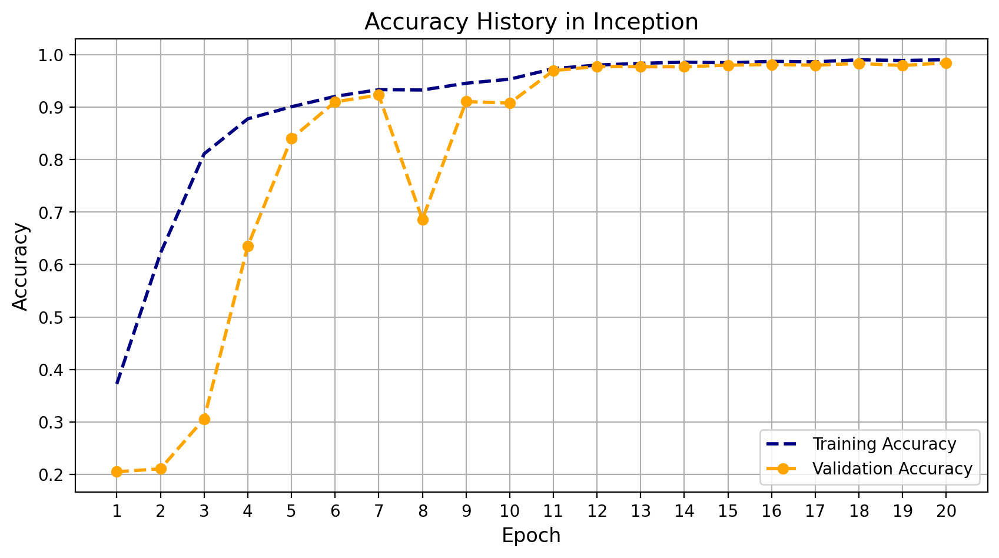

In [73]:
plt.figure(figsize=(10, 5), dpi=200)

plt.plot(epoch_count, train_accuracy_inception, 'r--', color='navy', label='Training Accuracy', linewidth=2)
plt.plot(epoch_count, valid_accuracy_inception, '--bo', color='orange', label='Validation Accuracy', linewidth=2)

plt.title('Accuracy History in Inception', fontsize=14)
plt.xlabel('Epoch', fontsize=12)
plt.ylabel('Accuracy', fontsize=12)

plt.grid(True)
plt.legend(loc='lower right')

plt.xticks(np.arange(1, 21, 1))

plt.show()

In [74]:
predictions_inception = inception_model.predict(test_dataset)

 2/26 ━━━━━━━━━━━━━━━━━━━━ 3s 160ms/step

W0000 00:00:1717889784.183614      77 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


26/26 ━━━━━━━━━━━━━━━━━━━━ 25s 812ms/step


W0000 00:00:1717889804.493049      79 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


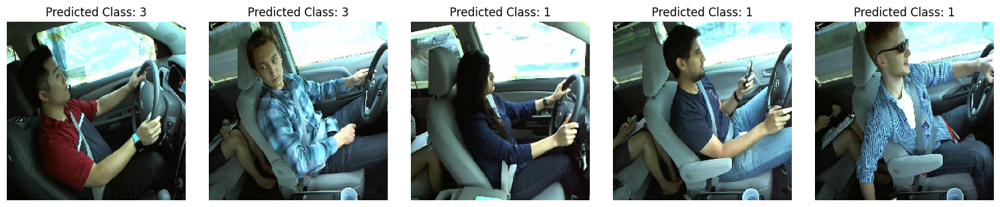

In [75]:
num_images = 5
random_indices = random.sample(range(len(test_dataset)), num_images)

num_rows = 1
num_cols = num_images

fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 3))

for i, idx in enumerate(random_indices):
    image, label = test_dataset[idx]
    prediction = predictions_inception[idx]
    
    ax = axes[i]
    ax.imshow(image[0]) 
    ax.axis('off')  
    
    predicted_class = np.argmax(prediction)
    
    ax.set_title(f'Predicted Class: {predicted_class}')

plt.tight_layout()
plt.show()

In [76]:
conf_matrix, sensitivity, specificity = plot_sensitivity_specificity(predictions_inception)
print("Sensitivity:", sensitivity)
print("Specificity:", specificity)

Sensitivity: 0.5905511811023622
Specificity: 0.576


In [78]:
evaluation_inception = inception_model.evaluate(test_dataset)

26/26 ━━━━━━━━━━━━━━━━━━━━ 9s 353ms/step - Precision: 0.9875 - Recall: 0.9830 - accuracy: 0.9836 - loss: 0.0454


W0000 00:00:1717889825.413995      78 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


In [79]:
eval_dict_inception = {metric_name: evaluation_value for metric_name, evaluation_value in zip(inception_model.metrics_names, evaluation_inception)}
eval_df_inception = pd.DataFrame([eval_dict_inception])

print("Evaluation metrics:")
eval_df_inception

Evaluation metrics:


,loss,compile_metrics
0,0.046115,0.985121


## So sánh

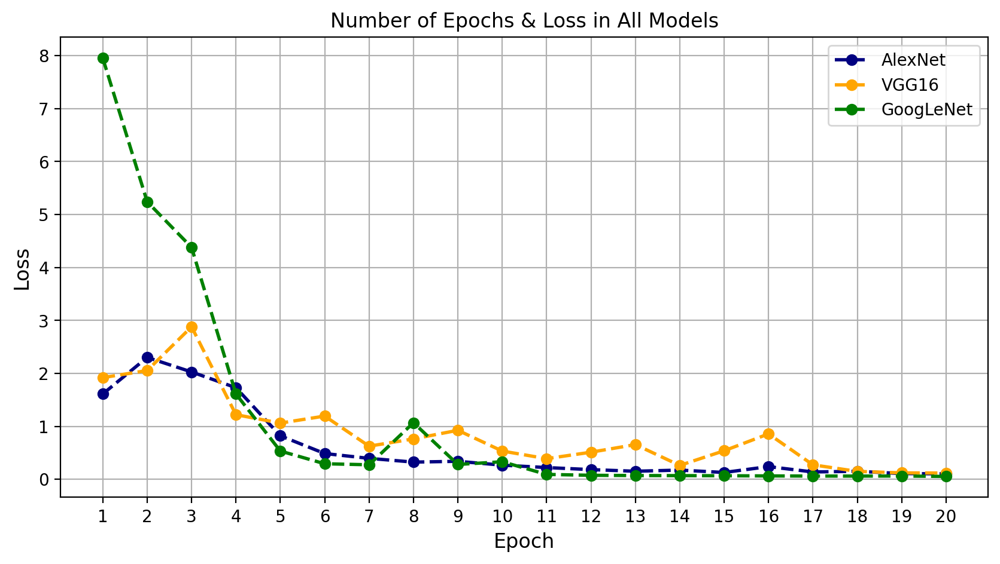

In [80]:
plt.figure(figsize=(10, 5), dpi=200)

plt.plot(epoch_count, valid_loss_alex, '--bo', color='navy', linewidth=2, label='AlexNet')
plt.plot(epoch_count, valid_loss_vgg16, '--bo', color='orange', linewidth=2, label='VGG16')
plt.plot(epoch_count, valid_loss_inception, '--bo', color='green', linewidth=2, label='GoogLeNet')

plt.title('Number of Epochs & Loss in All Models')
plt.xlabel('Epoch', fontsize=12)
plt.ylabel('Loss', fontsize=12)

plt.grid(True)
plt.legend(loc='upper right')

plt.xticks(np.arange(1, 21, 1))

plt.show()

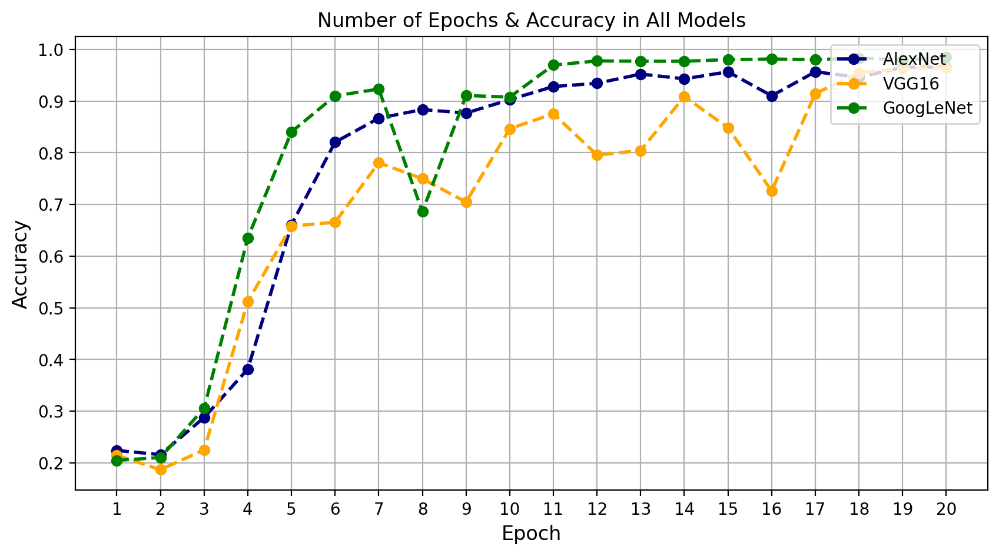

In [81]:
plt.figure(figsize=(10, 5), dpi=200)

plt.plot(epoch_count, valid_accuracy_alex, '--bo', color='navy', linewidth=2, label='AlexNet')
plt.plot(epoch_count, valid_accuracy_vgg16, '--bo', color='orange', linewidth=2, label='VGG16')
plt.plot(epoch_count, valid_accuracy_inception, '--bo', color='green', linewidth=2, label='GoogLeNet')

plt.title('Number of Epochs & Accuracy in All Models')
plt.xlabel('Epoch', fontsize=12)
plt.ylabel('Accuracy', fontsize=12)

plt.grid(True)
plt.legend(loc='upper right')

plt.xticks(np.arange(1, 21, 1))

plt.show()